In [161]:
import cv2
from matplotlib import pyplot as plt
from matplotlib.image import imread
import numpy as np
import os

In [162]:
train_files = 'D:\Projects\CV\EigenFace\Dataset\Train/'
test_files = 'D:\Projects\CV\EigenFace\Dataset\Test/'

train_images  = os.listdir(train_files)
test_images  = os.listdir(test_files)

width  = 195
height = 231

new_size = (195,231)

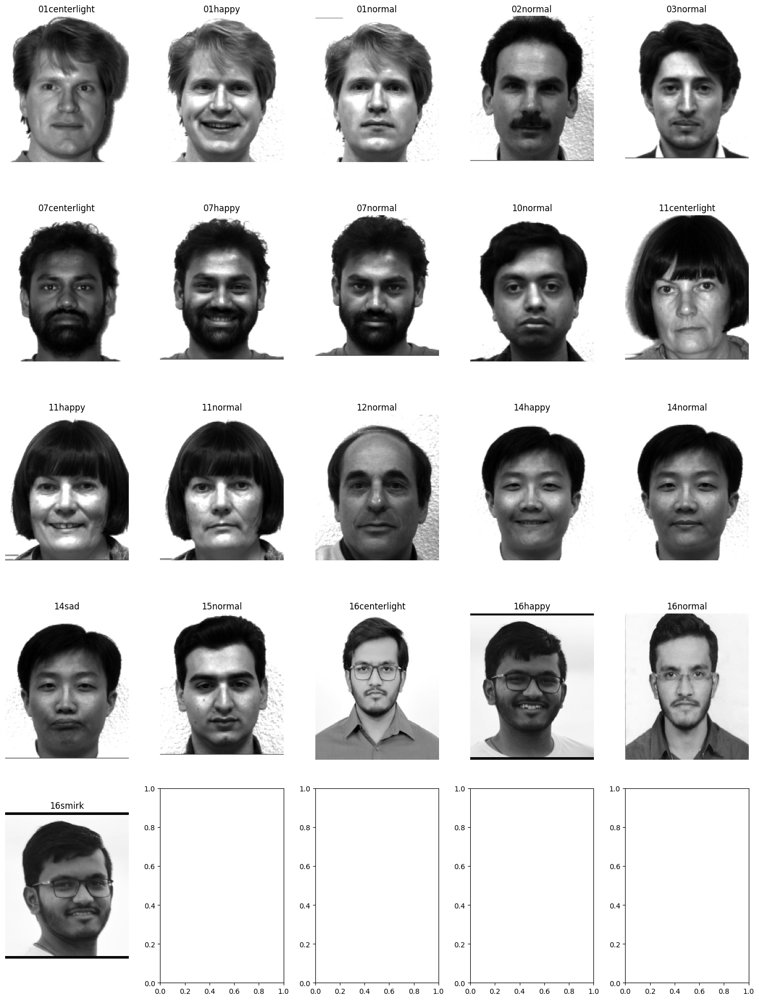

In [163]:
train_image_names = train_images
training_tensor = np.ndarray(shape=(len(train_image_names), height*width), dtype=np.float64)

fig, axs = plt.subplots(5, 5, figsize=(15, 20))
axs = axs.flatten()

for i in range(len(train_image_names)):
    img = plt.imread(train_files + train_image_names[i])
    if img.ndim == 3 and img.shape[2] == 3:
        # Convert to 1 channel grayscale
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img = cv2.resize(img, new_size)
    training_tensor[i,:] = np.array(img, dtype='float64').flatten()
    axs[i].imshow(img, cmap='gray')
    axs[i].set_title(train_image_names[i].split('.')[0][-2:]+train_image_names[i].split('.')[1])
    axs[i].tick_params(labelleft='off', labelbottom='off', bottom='off',top='off',right='off',left='off', which='both')
    axs[i].axis('off')

plt.tight_layout()
plt.show()

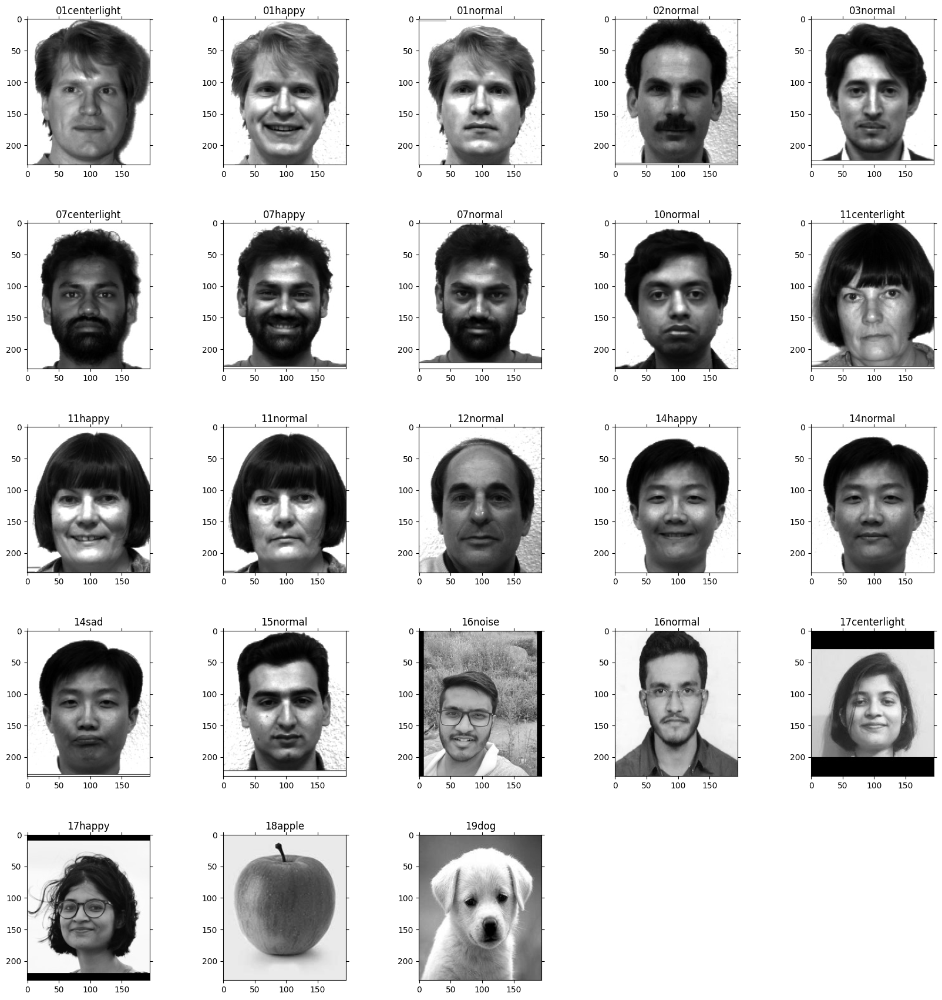

In [150]:
test_image_names = test_images
testing_tensor   = np.ndarray(shape=(len(test_image_names), height*width), dtype=np.float64)

fig = plt.figure(figsize=(15, 15))  # Create a larger figure

for i in range(len(test_image_names)):
    img = imread(test_files + test_image_names[i])
    if img.ndim == 3 and img.shape[2] == 3:
        # Convert to 1 channel grayscale
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img = cv2.resize(img,new_size)
    testing_tensor[i,:] = np.array(img, dtype='float64').flatten()
    ax = fig.add_subplot(5,5,1+i)  # Create a subplot axis object
    ax.set_title(test_image_names[i].split('.')[0][-2:]+test_image_names[i].split('.')[1])
    ax.imshow(img, cmap='gray')
    ax.tick_params(labelleft='off', labelbottom='off', bottom='off', top='off', right='off', left='off', which='both')

# Adjust spacing between subplots
fig.subplots_adjust(hspace=0.4, wspace=0.2, right=1.2, top=1.2)

plt.show()

######  Mean Face  ######


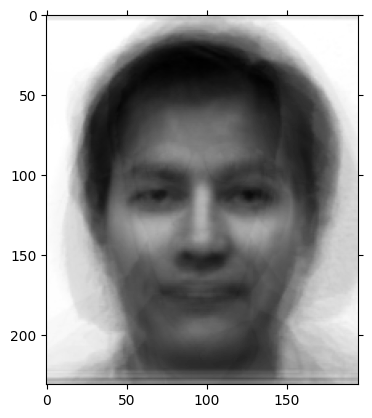

In [127]:
mean_face = np.zeros((1,height*width))

for i in training_tensor:
    mean_face = np.add(mean_face,i)

mean_face = np.divide(mean_face,float(len(train_image_names))).flatten()
print("######  Mean Face  ######")
plt.imshow(mean_face.reshape(height, width), cmap='gray')
plt.tick_params(labelleft='off', labelbottom='off', bottom='off',top='off',right='off',left='off', which='both')
plt.show()

In [128]:
normalised_training_tensor = np.ndarray(shape=(len(train_image_names), height*width))

for i in range(len(train_image_names)):
    normalised_training_tensor[i] = np.subtract(training_tensor[i],mean_face)

----  Normalized Face -----


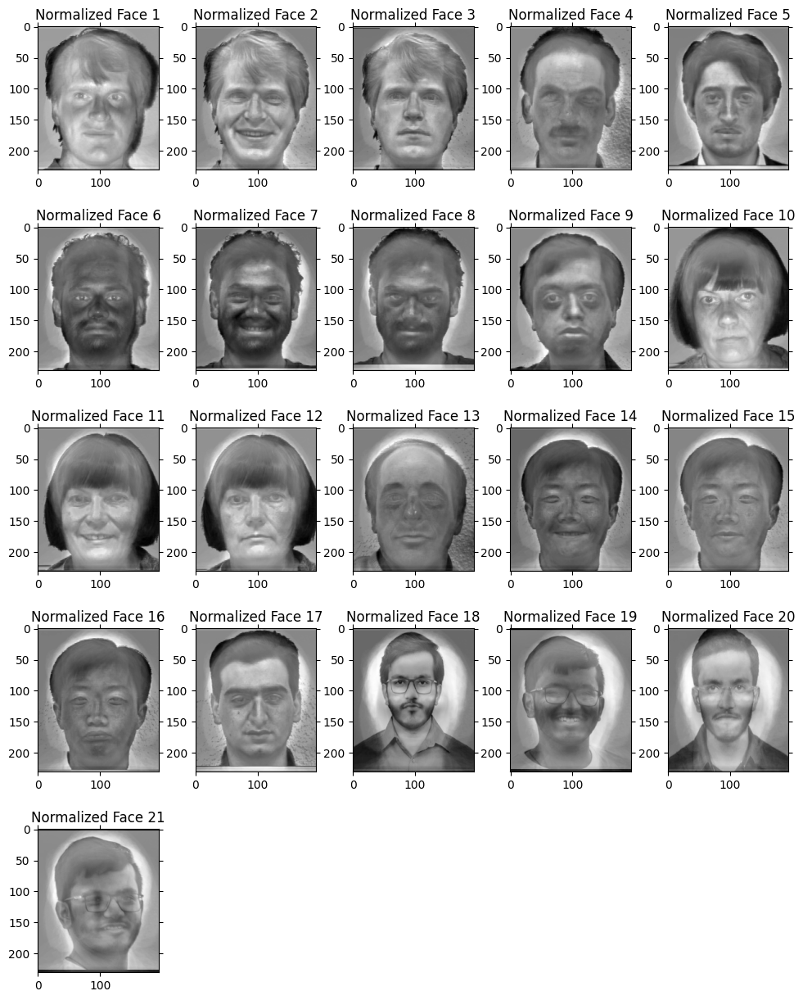

In [147]:
print("----  Normalized Face -----")
fig = plt.figure(figsize=(12, 15))  # Create a larger figure

for i in range(len(train_image_names)):
    img = normalised_training_tensor[i].reshape(height, width)
    ax = fig.add_subplot(5, 5, i+1)  # Create a subplot axis object
    ax.imshow(img, cmap='gray')
    ax.tick_params(labelleft='off', labelbottom='off', bottom='off', top='off', right='off', left='off', which='both')
    ax.set_title(f"Normalized Face {i+1}")  # Set a title for each subplot
    
# Adjust spacing between subplots
fig.subplots_adjust(hspace=0.4, wspace=0.2)

plt.show()


In [131]:
cov_matrix=np.cov(normalised_training_tensor)
cov_matrix = np.divide(cov_matrix,25.0)
print('Covariance Matrix Shape:', cov_matrix.shape)
print('Covariance matrix of X: \n%s' %cov_matrix)

Covariance Matrix Shape: (21, 21)
Covariance matrix of X: 
[[ 1.13149732e+02  3.45023831e+01  3.15986771e+01  9.92003873e+00
   2.08010434e+00 -2.05540338e+01 -3.49657299e+01 -1.81198704e+01
   7.92402258e-02  5.17070675e+01  7.20291628e+00  1.92091908e+00
  -1.66839956e+01 -1.64345267e+01 -3.70411150e+00 -1.18489191e+01
   3.39918546e+00 -3.32833859e+01 -4.08226102e+01 -2.37373482e+01
  -3.54057329e+01]
 [ 3.45023831e+01  6.94670675e+01  4.52805292e+01  1.13612722e+01
   1.88317448e+00 -1.60939984e+01 -1.64855655e+01 -1.89280536e+01
   2.14526471e+00 -2.57968441e+00  4.65776950e-01 -4.27553876e+00
  -2.56778322e-01  6.24831264e+00  1.72306217e+00 -8.23516629e-01
  -8.40785162e+00 -3.05260870e+01 -2.33577905e+01 -2.66094396e+01
  -2.47325387e+01]
 [ 3.15986771e+01  4.52805292e+01  7.63437059e+01 -7.49844350e+00
  -2.68713890e-01 -1.43320263e+01 -3.16027720e+01 -4.15940620e+01
   1.05154691e+01  4.25563560e+00  1.39168339e+01  1.95123320e+01
   1.66833528e+01  1.56438691e+01  1.56789589

In [132]:
eigenvalues, eigenvectors, = np.linalg.eig(cov_matrix)
print('Eigenvectors of Cov(X): \n%s' %eigenvectors)
print('\nEigenvalues of Cov(X): \n%s' %eigenvalues)
print('eigenvalues.shape: {} eigenvectors.shape: {}'.format(eigenvalues.shape, eigenvectors.shape))

Eigenvectors of Cov(X): 
[[-9.90108072e-02 -1.03981250e-01 -1.81534562e-01 -2.69948524e-01
   4.46181453e-01  7.59679151e-02 -2.18217890e-01 -3.48286443e-03
  -1.07846468e-01 -3.87649340e-01 -3.13290834e-02  1.56352739e-02
   1.55721106e-01  1.46647749e-01  3.10638055e-01 -1.47413772e-01
  -3.56333891e-01  9.39810943e-02  2.43961154e-01  3.14064139e-01
   2.76750585e-03]
 [-3.59842460e-02 -1.09424284e-01 -3.64702104e-02 -2.98630177e-01
   2.40324132e-01 -7.81447499e-02 -2.18217890e-01 -1.63285059e-01
   3.15971296e-01  6.14034928e-02  8.94175054e-02  3.59310283e-01
  -1.12415004e-01 -5.70314970e-01 -4.62356128e-02 -2.27167420e-01
   1.96820630e-01  1.30686364e-03  2.58184077e-02 -1.64104149e-01
   2.43709945e-01]
 [-8.56554593e-02 -1.55840222e-01  6.17774019e-02 -3.29356740e-01
   1.97779295e-01 -3.75392627e-02 -2.18217890e-01 -1.89396106e-01
   2.12615282e-01  5.24086807e-02 -1.34266159e-01 -3.55439747e-01
  -1.59946241e-01  5.33301611e-01 -3.08536534e-01 -4.88711035e-02
   7.60650712

In [133]:
eig_pairs = [(eigenvalues[index], eigenvectors[:,index]) for index in range(len(eigenvalues))]

# Sort the eigen pairs in descending order:
eig_pairs.sort(reverse=True)
eigvalues_sort  = [eig_pairs[index][0] for index in range(len(eigenvalues))]
eigvectors_sort = [eig_pairs[index][1] for index in range(len(eigenvalues))]

Cumulative proportion of variance explained vector: 
[0.25545888 0.44711409 0.57326282 0.64181459 0.70550147 0.7477297
 0.7839312  0.81379707 0.84315079 0.86843797 0.8916545  0.91266196
 0.93096204 0.94754284 0.96278997 0.97421802 0.98233374 0.98997835
 0.99563683 1.         1.        ]


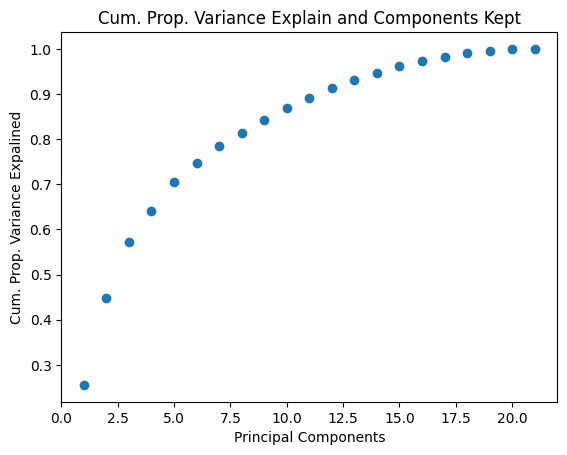

In [134]:
var_comp_sum = np.cumsum(eigvalues_sort)/sum(eigvalues_sort)

# Show cumulative proportion of varaince with respect to components
print("Cumulative proportion of variance explained vector: \n%s" %var_comp_sum)

# x-axis for number of principal components kept
num_comp = range(1,len(eigvalues_sort)+1)
plt.title('Cum. Prop. Variance Explain and Components Kept')
plt.xlabel('Principal Components')
plt.ylabel('Cum. Prop. Variance Expalined')

plt.scatter(num_comp, var_comp_sum)
plt.show()

In [135]:
## Choose the necessary no.of principle components:
reduced_data = np.array(eigvectors_sort[:19]).transpose()

In [136]:
print(training_tensor.transpose().shape, reduced_data.shape)

(45045, 21) (21, 19)


In [137]:
# Now we try to find the projected data. This will form the eigen space.
proj_data = np.dot(training_tensor.transpose(),reduced_data)
proj_data = proj_data.transpose()

----- Eigenface -----


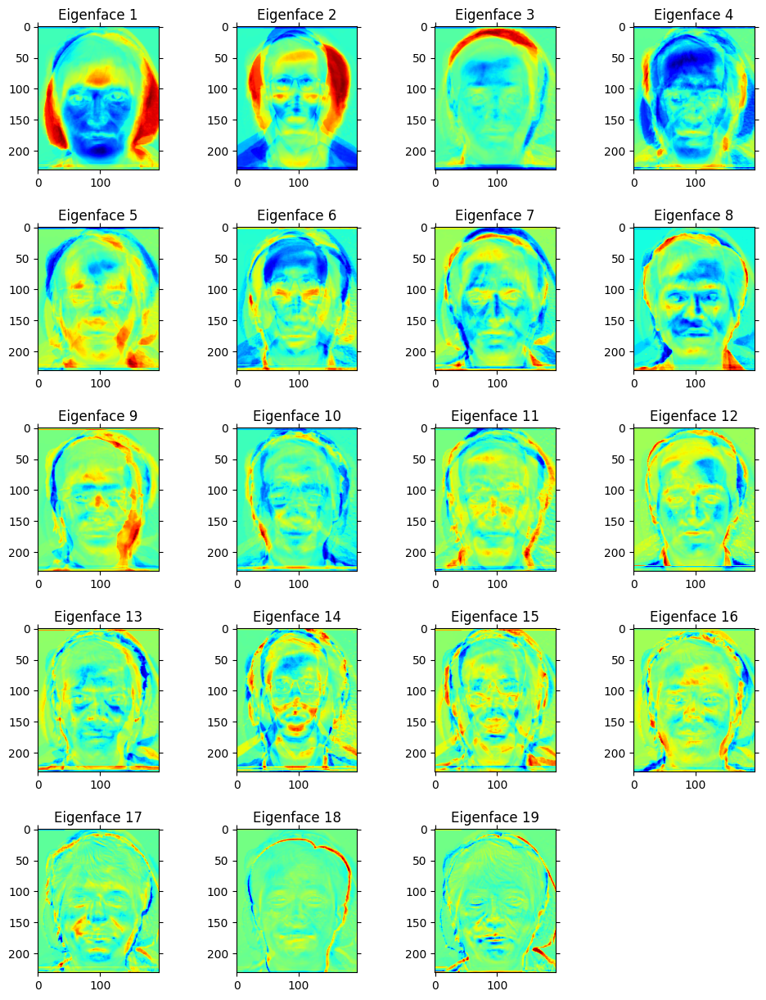

In [145]:
print("----- Eigenface -----")
fig = plt.figure(figsize=(12, 15))  # Create a larger figure

for i in range(proj_data.shape[0]):
    img = proj_data[i].reshape(height, width)
    ax = fig.add_subplot(5, 4, i+1)  # Create a subplot axis object
    ax.imshow(img, cmap='jet')
    ax.tick_params(labelleft='off', labelbottom='off', bottom='off', top='off', right='off', left='off', which='both')
    ax.set_title(f"Eigenface {i+1}")  # Set a title for each subplot
    
# Adjust spacing between subplots
fig.subplots_adjust(hspace=0.4, wspace=0.2)

plt.show()


In [164]:
## Finding weights for each traning image
w = np.array([np.dot(proj_data,i) for i in normalised_training_tensor])
print(w.shape)
print(w)

(21, 19)
[[-9.46983830e+07 -7.78221489e+07 -7.60016364e+07 -4.30662572e+07
   9.27169856e+07  1.46597728e+06  9.52736140e+06 -2.04073991e+07
  -3.85288222e+07 -1.37967531e+07 -3.08676587e+07  1.10988014e+07
   1.98754413e+07 -3.14523774e+06  1.62846535e+07  1.25448894e+07
   1.93474645e+06  4.01500545e+06 -3.36051633e+05]
 [ 2.73791340e+06 -3.40618596e+07 -1.10727380e+07 -1.11828732e+08
   4.91588800e+07  1.29110756e+07 -4.54269295e+07  5.68687824e+07
   9.81724132e+06 -1.43023712e+07  2.52702938e+07 -1.22290905e+07
  -1.25546386e+07  2.18327734e+07 -9.99165631e+06 -4.33527059e+06
  -9.95385186e+06 -3.16847306e+06  8.26071287e+06]
 [-2.96894440e+07 -5.37297301e+07  3.03177050e+07 -1.30957718e+08
   4.01654718e+07  2.49119057e+07 -5.56137767e+07  5.39259996e+07
   1.00309423e+07  1.56173980e+06  1.89707264e+07 -1.81794604e+07
  -3.09123734e+07  1.93591936e+07 -1.38442841e+07 -1.48002083e+07
   2.05797541e+07 -4.45188661e+06 -4.45408918e+06]
 [ 7.21636423e+07 -4.43922148e+07 -1.32991648e

In [192]:
from skimage.metrics import mean_squared_error

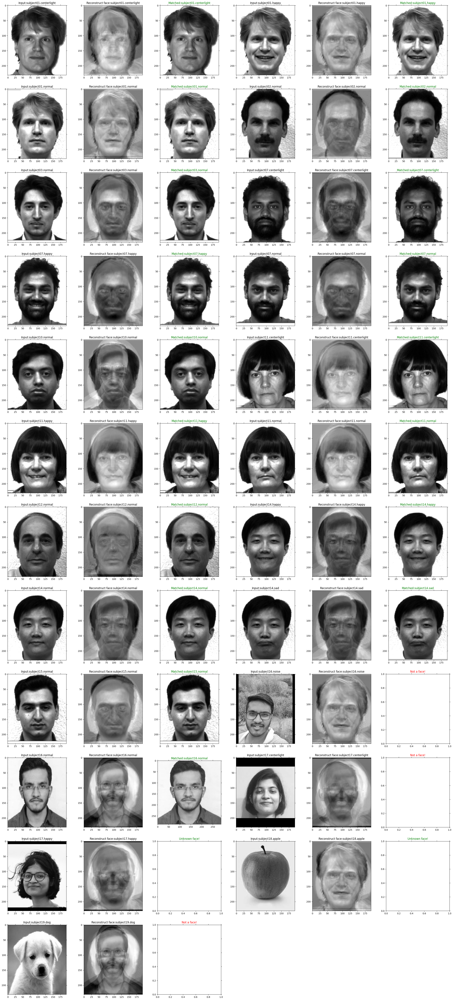

Correct predictions: 20/23 = 86.95652173913044%
MSE -  {'subject01.centerlight.jpg': 3.9705690484065455e+20, 'subject01.happy.jpg': 1.7042417436638308e+20, 'subject01.normal.jpg': 2.456720983473184e+20, 'subject02.normal.jpg': 3.124515584971695e+20, 'subject03.normal.jpg': 3.8276354425720504e+20, 'subject07.centerlight.jpg': 5.1912170696714846e+20, 'subject07.happy.jpg': 8.645261009424796e+20, 'subject07.normal.jpg': 8.57330806551469e+20, 'subject10.normal.jpg': 3.17502658669801e+20, 'subject11.centerlight.jpg': 4.4629219285890184e+21, 'subject11.happy.jpg': 4.6479156576075016e+21, 'subject11.normal.jpg': 4.291590541872074e+21, 'subject12.normal.jpg': 1.754546777484493e+20, 'subject14.happy.jpg': 3.799707985107786e+20, 'subject14.normal.jpg': 3.7654022108645065e+20, 'subject14.sad.jpg': 4.205040383214326e+20, 'subject15.normal.jpg': 7.906908706472358e+20, 'subject16.noise.jpg': 1.7042417539134797e+20, 'subject16.normal.jpg': 3.153429860891389e+21, 'subject17.centerlight.jpg': 1.1482815

In [194]:
from skimage.metrics import mean_squared_error

## MSE 
mse_dict = {}
# Final

count        = 0
num_images   = 0
correct_pred = 0

def recogniser(img, train_image_names,proj_data,w):
    global count,highest_min,num_images,correct_pred,mse_dict
    unknown_face        = plt.imread('D:\Projects\CV\EigenFace\Dataset\Test/'+img)
    num_images          += 1

    if unknown_face.ndim == 3 and unknown_face.shape[2] == 3:
        # Convert to 1 channel grayscale
        unknown_face = cv2.cvtColor(unknown_face, cv2.COLOR_BGR2GRAY)
        unknown_face = cv2.resize(unknown_face,new_size)

    unknown_face_vector = np.array(unknown_face, dtype='float64').flatten()
    normalised_uface_vector = np.subtract(unknown_face_vector,mean_face)
    
    plt.subplot(12,6,1+count)
    plt.imshow(unknown_face, cmap='gray')
    plt.title('Input:'+'.'.join(img.split('.')[:2]))
    plt.tick_params(labelleft='off', labelbottom='off', bottom='off',top='off',right='off',left='off', which='both')
    count+=1

    w_unknown = np.dot(proj_data, normalised_uface_vector)
    diff  = w - w_unknown
    norms = np.linalg.norm(diff, axis=1)
    index = np.argmin(norms)
    
    # Reconstruct face image using eigenfaces
    weights = w[index]
    face_vector = mean_face + np.dot(weights, proj_data)
    face_vector = face_vector.reshape(height, width)

    plt.subplot(12,6,1+count)
    plt.imshow(face_vector, cmap='gray')
    plt.title('Reconstruct face:'+'.'.join(img.split('.')[:2]))
    count+=1

    #t1 = 100111536
    t1 = 200535910.268 # working with 6 faces
    #t0 = 86528212
    #t0 = 88831687
    t0 = 143559033 # working with 6 faces
    
    if norms[index] < t1:
        plt.subplot(12,6,1+count)
        if norms[index] < t0: # It's a face
            if img.split('.')[0] == train_image_names[index].split('.')[0]:
                plt.title('Matched:'+'.'.join(train_image_names[index].split('.')[:2]), color='g')
                plt.imshow(imread('D:\Projects\CV\EigenFace\Dataset\Train/'+train_image_names[index]), cmap='gray')
                
                correct_pred += 1
            else:
                plt.title('Matched:'+'.'.join(train_image_names[index].split('.')[:2]), color='r')
                plt.imshow(imread('D:\Projects\CV\EigenFace\Dataset\Train/'+train_image_names[index]), cmap='gray')
        else:
            if img.split('.')[0] not in [i.split('.')[0] for i in train_image_names] :
                plt.title('Unknown face!', color='g')
                correct_pred += 1
            else:
                plt.title('Unknown face!', color='r')
        plt.tick_params(labelleft='off', labelbottom='off', bottom='off',top='off',right='off',left='off', which='both')
        plt.subplots_adjust(right=1.2, top=2.5)
    else:     
        plt.subplot(12,6,1+count)
        if len(img.split('.')) == 3:
            plt.title('Not a face!', color='r')
        else:
            plt.title('Not a face!', color='g')
            correct_pred += 1
        plt.tick_params(labelleft='off', labelbottom='off', bottom='off',top='off',right='off',left='off', which='both')
    count+=1

    mse_dict[img] = mean_squared_error(unknown_face, face_vector)

fig = plt.figure(figsize=(25, 25))
for i in range(len(test_image_names)):
    recogniser(test_image_names[i], train_image_names,proj_data,w)

plt.show()

print('Correct predictions: {}/{} = {}%'.format(correct_pred, num_images, correct_pred/num_images*100.00))
print("MSE - ",mse_dict)

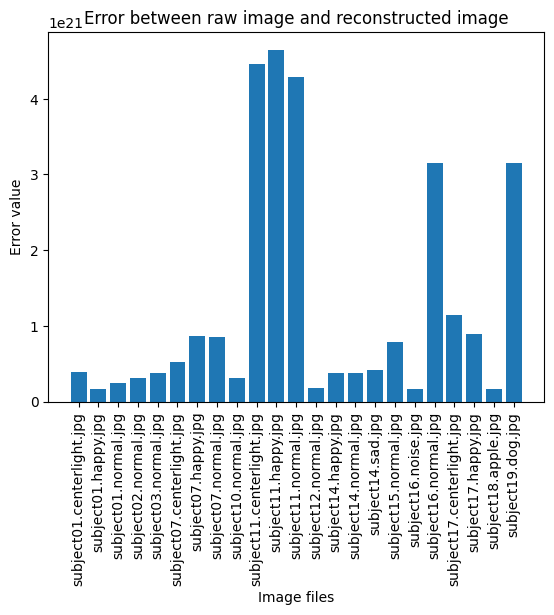

In [199]:
plt.bar(mse_dict.keys(), mse_dict.values())

# set the x-axis label and rotate the labels for better visibility
plt.xlabel('Image files')
plt.xticks(rotation=90)
plt.ylabel('Error value')
plt.title('Error between raw image and reconstructed image')

plt.show()

In [213]:
sorted_dict = sorted(mse_dict.items(), key=lambda x:x[1])

In [216]:
print(sorted_dict)

[('subject01.happy.jpg', 1.7042417436638308e+20), ('subject18.apple.jpg', 1.704241750454574e+20), ('subject16.noise.jpg', 1.7042417539134797e+20), ('subject12.normal.jpg', 1.754546777484493e+20), ('subject01.normal.jpg', 2.456720983473184e+20), ('subject02.normal.jpg', 3.124515584971695e+20), ('subject10.normal.jpg', 3.17502658669801e+20), ('subject14.normal.jpg', 3.7654022108645065e+20), ('subject14.happy.jpg', 3.799707985107786e+20), ('subject03.normal.jpg', 3.8276354425720504e+20), ('subject01.centerlight.jpg', 3.9705690484065455e+20), ('subject14.sad.jpg', 4.205040383214326e+20), ('subject07.centerlight.jpg', 5.1912170696714846e+20), ('subject15.normal.jpg', 7.906908706472358e+20), ('subject07.normal.jpg', 8.57330806551469e+20), ('subject07.happy.jpg', 8.645261009424796e+20), ('subject17.happy.jpg', 8.955492935511815e+20), ('subject17.centerlight.jpg', 1.1482815317143295e+21), ('subject16.normal.jpg', 3.153429860891389e+21), ('subject19.dog.jpg', 3.1534298632264976e+21), ('subject1